In [1]:
from skimage.io import imread
from skimage.color import rgb2hsv, gray2rgb, hsv2rgb
import matplotlib.pyplot as plt
from skimage.util import invert
import numpy as np
import cv2
from skimage.exposure import adjust_gamma

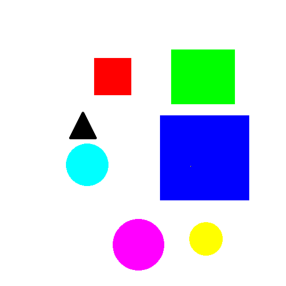

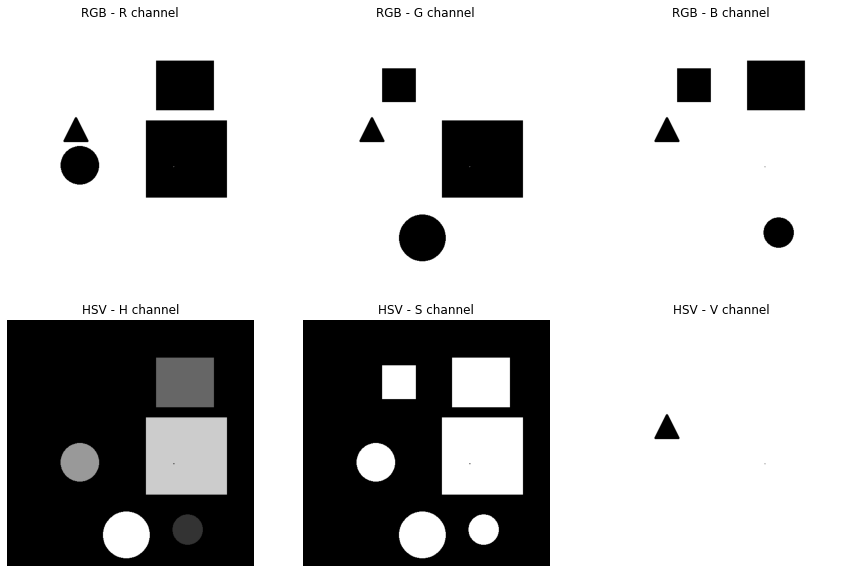

In [2]:
# Exercise 1

im_rgb = imread('simple_shapes.png')
im_hsv = rgb2hsv(im_rgb)

plt.figure(figsize=(5, 5))
plt.imshow(im_rgb), plt.axis('off')
plt.show()

plt.figure(figsize=(15, 10))
plt.subplot(231), plt.imshow(im_rgb[:, :, 0], cmap='gray'), plt.title('RGB - R channel'), plt.axis('off')
plt.subplot(232), plt.imshow(im_rgb[:, :, 1], cmap='gray'), plt.title('RGB - G channel'), plt.axis('off')
plt.subplot(233), plt.imshow(im_rgb[:, :, 2], cmap='gray'), plt.title('RGB - B channel'), plt.axis('off')
plt.subplot(234), plt.imshow(im_hsv[:, :, 0], cmap='gray'), plt.title('HSV - H channel'), plt.axis('off')
plt.subplot(235), plt.imshow(im_hsv[:, :, 1], cmap='gray'), plt.title('HSV - S channel'), plt.axis('off')
plt.subplot(236), plt.imshow(im_hsv[:, :, 2], cmap='gray'), plt.title('HSV - V channel'), plt.axis('off')
plt.show()

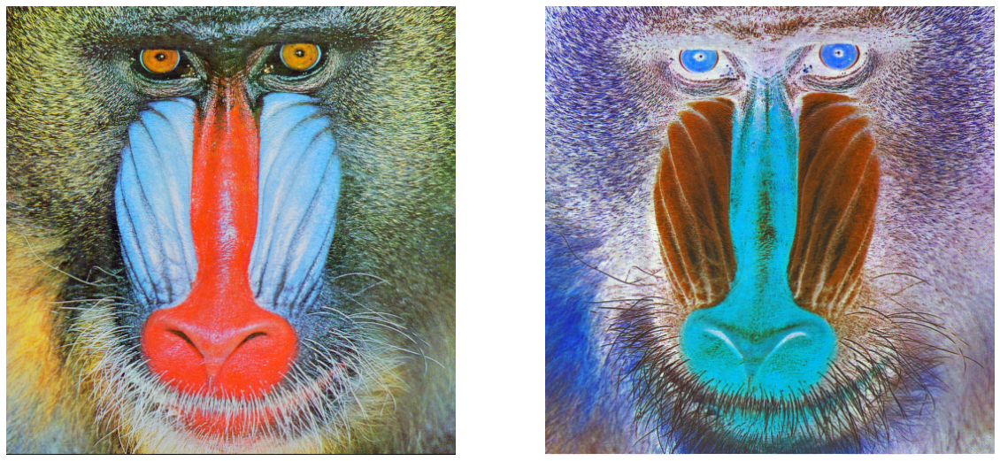

In [3]:
# Exercise 2

im = imread('monkey.tiff')
im_inverted = invert(im)

plt.figure(figsize=(20, 15))
plt.subplot(121), plt.imshow(im), plt.axis('off')
plt.subplot(122), plt.imshow(im_inverted), plt.axis('off')
plt.show()

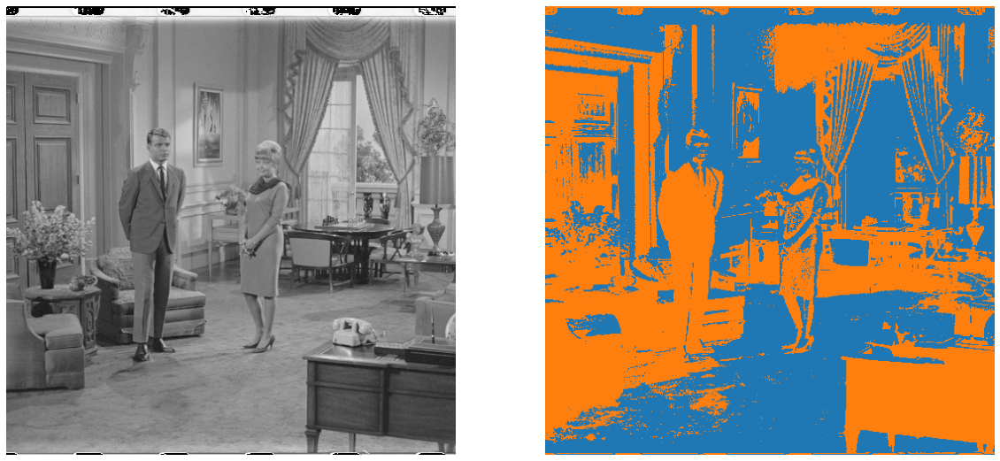

In [4]:
# Exercise 3

im = imread('couple.tiff')
im_rgb = gray2rgb(im)
im_rgb[im < 125] = (255, 127, 14)
im_rgb[im >= 125] = (31, 119, 180)

plt.figure(figsize=(20, 15))
plt.subplot(121), plt.imshow(im, cmap='gray'), plt.axis('off')
plt.subplot(122), plt.imshow(im_rgb), plt.axis('off')
plt.show()

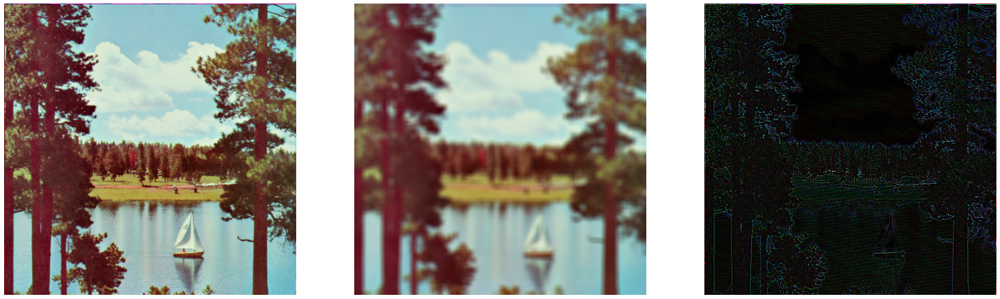

In [5]:
# Exercise 4

im = imread('boat.tiff')

kernel = np.ones((11, 11)) / 121
im_mean_11_11 = cv2.filter2D(im, cv2.CV_8U, kernel)

laplacian = np.array([
    [ 0,-1, 0],
    [-1, 4,-1],
    [ 0,-1, 0]
])
im_laplacian = cv2.filter2D(im, cv2.CV_8U, laplacian)

plt.figure(figsize=(30, 15))
plt.subplot(131), plt.imshow(im), plt.axis('off')
plt.subplot(132), plt.imshow(im_mean_11_11), plt.axis('off')
plt.subplot(133), plt.imshow(im_laplacian), plt.axis('off')
plt.show()

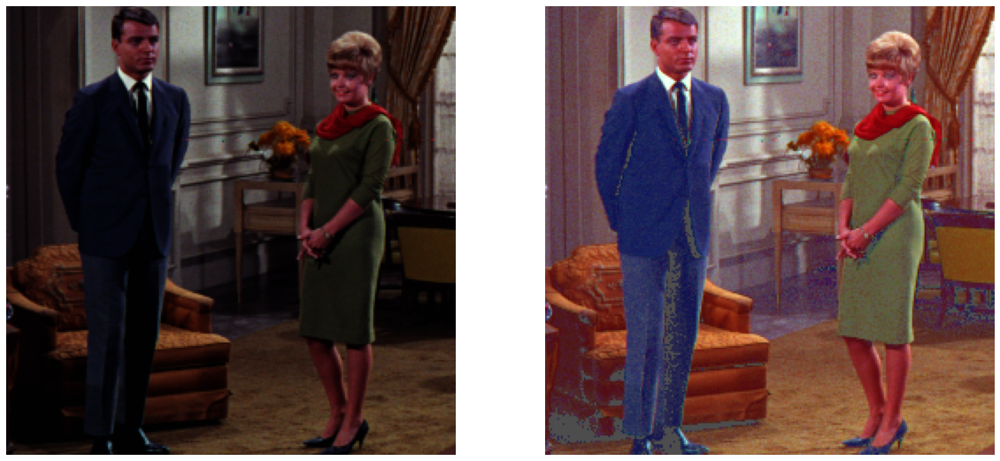

In [6]:
# Exercise 5.1

im_rgb = imread('couple_dark.tiff')
im_hsv = rgb2hsv(im_rgb)

im_hsv[:, :, 2] += 0.3
im_hsv[im_hsv > 1] = 1

plt.figure(figsize=(20, 15))
plt.subplot(121), plt.imshow(im_rgb), plt.axis('off')
plt.subplot(122), plt.imshow(hsv2rgb(im_hsv)), plt.axis('off')
plt.show()

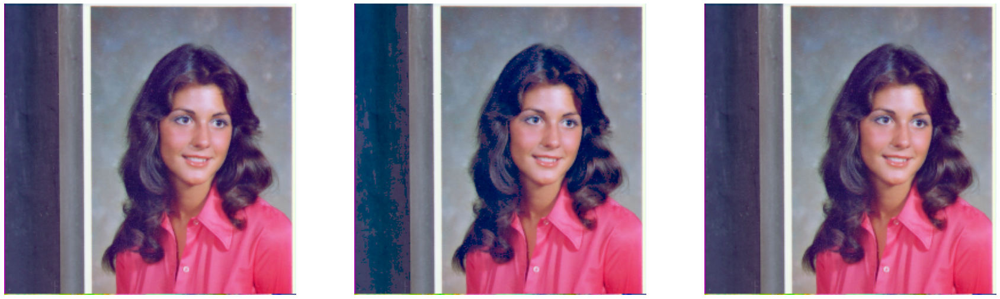

In [7]:
# Exercise 5.2

im = imread('female.tiff')
im_red = imread('femaleRED.tiff')
im_blue = imread('femaleBLUE.tiff')

im_red[:, :, 0] = adjust_gamma(im_red[:, :, 0], 0.25)
im_blue[:, :, 2] = adjust_gamma(im_blue[:, :, 2], 4)

plt.figure(figsize=(30, 15))
plt.subplot(131), plt.imshow(im), plt.axis('off')
plt.subplot(132), plt.imshow(im_red), plt.axis('off')
plt.subplot(133), plt.imshow(im_blue), plt.axis('off')
plt.show()

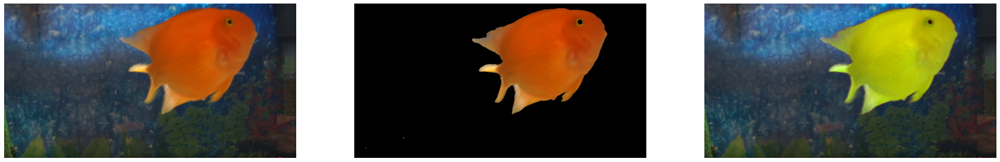

In [8]:
# Exercise 6

im_rgb = imread('fish.png')
im_hsv = cv2.cvtColor(im_rgb, cv2.COLOR_BGR2HSV)

mask = cv2.inRange(im_hsv, (95, 30, 120), (115, 255, 255))
res = cv2.bitwise_and(im_rgb, im_rgb, mask=mask)
im_hsv[mask>0] = im_hsv[mask>0] - (20, 0, 0)
im_output = cv2.cvtColor(im_hsv, cv2.COLOR_HSV2BGR)

plt.figure(figsize=(30, 15))
plt.subplot(131), plt.imshow(im_rgb), plt.axis('off')
plt.subplot(132), plt.imshow(res), plt.axis('off')
plt.subplot(133), plt.imshow(im_output), plt.axis('off')
plt.show()